# MMSegmentation Tutorial
Welcome to MMSegmentation! 

In this tutorial, we demo
* How to do inference with MMSeg trained weight
* How to train on your own dataset and visualize the results. 

## Install MMSegmentation
This step may take several minutes. 

We use PyTorch 1.10 and CUDA 11.1 for this tutorial. You may install other versions by change the version number in pip install command. 

In [1]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_21:12:58_PST_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# Install PyTorch
!pip install torch==1.12.0 torchvision --extra-index-url https://download.pytorch.org/whl/cu113
# Install MMCV
!pip install openmim
!mim install mmcv-full==1.6.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/, https://download.pytorch.org/whl/cu113
     |██████████████▌                 | 834.1 MB 1.3 MB/s eta 0:12:47tcmalloc: large alloc 1147494400 bytes == 0x393f2000 @  0x7fa49b384615 0x5d6f4c 0x51edd1 0x51ef5b 0x4f750a 0x4997a2 0x4fd8b5 0x4997c7 0x4fd8b5 0x49abe4 0x4f5fe9 0x55e146 0x4f5fe9 0x55e146 0x4f5fe9 0x55e146 0x5d8868 0x5da092 0x587116 0x5d8d8c 0x55dc1e 0x55cd91 0x5d8941 0x49abe4 0x55cd91 0x5d8941 0x4990ca 0x5d8868 0x4997a2 0x4fd8b5 0x49abe4
     |██████████████████▍             | 1055.7 MB 1.3 MB/s eta 0:09:52tcmalloc: large alloc 1434370048 bytes == 0x7da48000 @  0x7fa49b384615 0x5d6f4c 0x51edd1 0x51ef5b 0x4f750a 0x4997a2 0x4fd8b5 0x4997c7 0x4fd8b5 0x49abe4 0x4f5fe9 0x55e146 0x4f5fe9 0x55e146 0x4f5fe9 0x55e146 0x5d8868 0x5da092 0x587116 0x5d8d8c 0x55dc1e 0x55cd91 0x5d8941 0x49abe4 0x55cd91 0x5d8941 0x4990ca 0x5d8868 0x4997a2 0x4fd8b5 0x49abe4
     |███████████████████████▎        | 

In [3]:
!rm -rf mmsegmentation
!git clone https://github.com/open-mmlab/mmsegmentation.git 
%cd mmsegmentation
!pip install -e .

Cloning into 'mmsegmentation'...
remote: Enumerating objects: 12909, done.
remote: Counting objects: 100% (329/329), done.
remote: Compressing objects: 100% (208/208), done.
remote: Total 12909 (delta 171), reused 231 (delta 120), pack-reused 12580
Receiving objects: 100% (12909/12909), 15.16 MiB | 8.46 MiB/s, done.
Resolving deltas: 100% (9309/9309), done.
/content/mmsegmentation
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/mmsegmentation
     |████████████████████████████████| 648 kB 3.2 MB/s 
  Running setup.py develop for mmsegmentation


In [4]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMSegmentation installation
import mmseg
print(mmseg.__version__)

1.12.0+cu113 True
0.29.1


## Run Inference with MMSeg trained weight

In [5]:
!mkdir checkpoints
!wget https://download.openmmlab.com/mmsegmentation/v0.5/pspnet/pspnet_r50-d8_512x1024_40k_cityscapes/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth -P checkpoints

--2022-12-16 01:15:37--  https://download.openmmlab.com/mmsegmentation/v0.5/pspnet/pspnet_r50-d8_512x1024_40k_cityscapes/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.74.197.64
Connecting to download.openmmlab.com (download.openmmlab.com)|47.74.197.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 196205945 (187M) [application/octet-stream]
Saving to: ‘checkpoints/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth’

pspnet_r50-d8_512x1 100%[===================>] 187.12M  27.3MB/s    in 6.8s    

2022-12-16 01:15:44 (27.4 MB/s) - ‘checkpoints/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth’ saved [196205945/196205945]



In [6]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
from mmseg.core.evaluation import get_palette

In [7]:
config_file = 'configs/pspnet/pspnet_r50-d8_512x1024_40k_cityscapes.py'
checkpoint_file = 'checkpoints/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth'

In [8]:
# build the model from a config file and a checkpoint file
model = init_segmentor(config_file, checkpoint_file, device='cuda:0')

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:235: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  warnings.warn(


load checkpoint from local path: checkpoints/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth


In [9]:
# test a single image
img = 'demo/demo.png'
result = inference_segmentor(model, img)

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


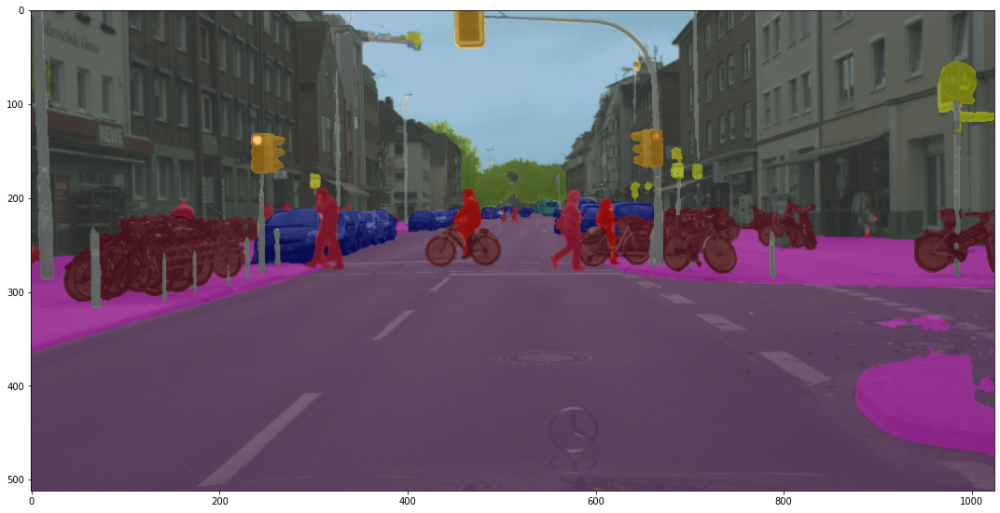

In [10]:
# show the results
show_result_pyplot(model, img, result, get_palette('cityscapes'))

## Train a semantic segmentation model on a new dataset

To train on a customized dataset, the following steps are necessary. 
1. Add a new dataset class. 
2. Create a config file accordingly. 
3. Perform training and evaluation. 

### Add a new dataset

Datasets in MMSegmentation require image and semantic segmentation maps to be placed in folders with the same prefix. To support a new dataset, we may need to modify the original file structure. 

In this tutorial, we give an example of converting the dataset. You may refer to [docs](https://github.com/open-mmlab/mmsegmentation/blob/master/docs/en/tutorials/customize_datasets.md#customize-datasets-by-reorganizing-data) for details about dataset reorganization. 

We use [Stanford Background Dataset](http://dags.stanford.edu/projects/scenedataset.html) as an example. The dataset contains 715 images chosen from existing public datasets [LabelMe](http://labelme.csail.mit.edu), [MSRC](http://research.microsoft.com/en-us/projects/objectclassrecognition), [PASCAL VOC](http://pascallin.ecs.soton.ac.uk/challenges/VOC) and [Geometric Context](http://www.cs.illinois.edu/homes/dhoiem/). Images from these datasets are mainly outdoor scenes, each containing approximately 320-by-240 pixels. 
In this tutorial, we use the region annotations as labels. There are 8 classes in total, i.e. sky, tree, road, grass, water, building, mountain, and foreground object. 

In [ ]:
# download and unzip
!wget http://dags.stanford.edu/data/iccv09Data.tar.gz -O stanford_background.tar.gz
!tar xf stanford_background.tar.gz

In [ ]:
!unzip anomaly_dataset.zip -d /content/mmsegmentation

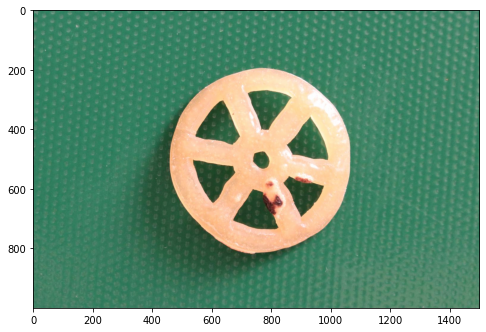

In [16]:
# Let's take a look at the dataset
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('/content/mmsegmentation/anomaly_dataset/images/004.JPG')
plt.figure(figsize=(8, 6))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

We need to convert the annotation into semantic map format as an image.

In [17]:
import os.path as osp
import numpy as np
from PIL import Image
# convert dataset annotation to semantic segmentation map
data_root = 'anomaly_dataset'
img_dir = 'images'
ann_dir = 'labels'
# define class and plaette for better visualization
classes = ('anomalous region' , 'background')
palette = [[255,0,0],[0,0,0]]


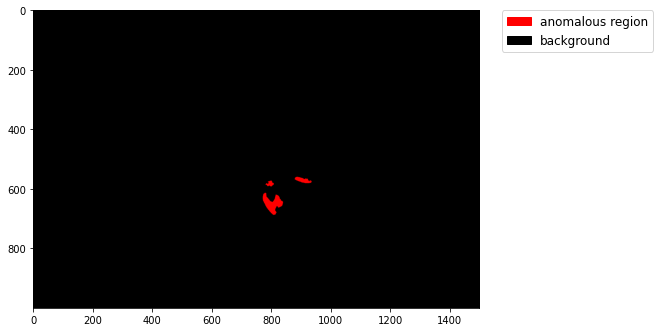

In [18]:
# Let's take a look at the segmentation map we got
import matplotlib.patches as mpatches
img = Image.open('/content/mmsegmentation/anomaly_dataset/labels/004.png')
plt.figure(figsize=(8, 6))
im = plt.imshow(np.array(img.convert('RGB')))

# create a patch (proxy artist) for every color 
patches = [mpatches.Patch(color=np.array(palette[i])/255., 
                          label=classes[i]) for i in range(2)]
# put those patched as legend-handles into the legend
plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
           fontsize='large')

plt.show()

In [19]:
# split train/val set randomly
split_dir = 'splits'
mmcv.mkdir_or_exist(osp.join(data_root, split_dir))
filename_list = [osp.splitext(filename)[0] for filename in mmcv.scandir(
    osp.join(data_root, ann_dir), suffix='.png')]
with open(osp.join(data_root, split_dir, 'train.txt'), 'w') as f:
  # select first 4/5 as train set
  train_length = int(len(filename_list)*4/5)
  f.writelines(line + '\n' for line in filename_list[:train_length])
with open(osp.join(data_root, split_dir, 'val.txt'), 'w') as f:
  # select last 1/5 as train set
  f.writelines(line + '\n' for line in filename_list[train_length:])

After downloading the data, we need to implement `load_annotations` function in the new dataset class `StanfordBackgroundDataset`.

In [20]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

@DATASETS.register_module()
class VisA(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.JPG', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

    

### Create a config file
In the next step, we need to modify the config for the training. To accelerate the process, we finetune the model from trained weights.

In [21]:
from mmcv import Config
cfg = Config.fromfile('configs/pspnet/pspnet_r50-d8_512x1024_40k_cityscapes.py')

Since the given config is used to train PSPNet on the cityscapes dataset, we need to modify it accordingly for our new dataset.  

In [22]:
from mmseg.apis import set_random_seed
from mmseg.utils import get_device

# Since we use only one GPU, BN is used instead of SyncBN
cfg.norm_cfg = dict(type='BN', requires_grad=True)
cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg
cfg.model.auxiliary_head.norm_cfg = cfg.norm_cfg
# modify num classes of the model in decode/auxiliary head
cfg.model.decode_head.num_classes = 8
cfg.model.auxiliary_head.num_classes = 8

# Modify dataset type and path
cfg.dataset_type = 'VisA'
cfg.data_root = data_root

cfg.data.samples_per_gpu = 8
cfg.data.workers_per_gpu=8

cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (256, 256)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(320, 240), ratio_range=(0.5, 2.0)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(320, 240),
        # img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]


cfg.data.train.type = cfg.dataset_type
cfg.data.train.data_root = cfg.data_root
cfg.data.train.img_dir = img_dir
cfg.data.train.ann_dir = ann_dir
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = 'splits/train.txt'

cfg.data.val.type = cfg.dataset_type
cfg.data.val.data_root = cfg.data_root
cfg.data.val.img_dir = img_dir
cfg.data.val.ann_dir = ann_dir
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = 'splits/val.txt'

cfg.data.test.type = cfg.dataset_type
cfg.data.test.data_root = cfg.data_root
cfg.data.test.img_dir = img_dir
cfg.data.test.ann_dir = ann_dir
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = 'splits/val.txt'

# We can still use the pre-trained Mask RCNN model though we do not need to
# use the mask branch
cfg.load_from = 'checkpoints/pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth'

# Set up working dir to save files and logs.
cfg.work_dir = './work_dirs/tutorial'

cfg.runner.max_iters = 600
cfg.log_config.interval = 10
cfg.evaluation.interval = 20
cfg.checkpoint_config.interval = 20

# Set seed to facitate reproducing the result
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)
cfg.device = get_device()

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained='open-mmlab://resnet50_v1c',
    backbone=dict(
        type='ResNetV1c',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        dilations=(1, 1, 2, 4),
        strides=(1, 2, 1, 1),
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=False,
        style='pytorch',
        contract_dilation=True),
    decode_head=dict(
        type='PSPHead',
        in_channels=2048,
        in_index=3,
        channels=512,
        pool_scales=(1, 2, 3, 6),
        dropout_ratio=0.1,
        num_classes=8,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    auxiliary_head=dict(
        type='FCNHead',
        in_channels=1024,
        in_index=2,
        channels=256,
        num_convs=1,
        concat_input=F

### Train and Evaluation

In [23]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor


# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True, 
                meta=dict())

2022-12-16 01:22:54,912 - mmseg - INFO - Loaded 48 images
/content/mmsegmentation/mmseg/models/backbones/resnet.py:431: UserWarning: DeprecationWarning: pretrained is a deprecated, please use "init_cfg" instead
  warnings.warn('DeprecationWarning: pretrained is a deprecated, '
/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:235: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowne

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 3.8 task/s, elapsed: 3s, ETA:     0s

2022-12-16 01:23:25,483 - mmseg - INFO - per class results:
2022-12-16 01:23:25,488 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 97.49 | 100.0 |
|    background    |  0.0  |  0.0  |
+------------------+-------+-------+
2022-12-16 01:23:25,490 - mmseg - INFO - Summary:
2022-12-16 01:23:25,492 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 97.49 | 48.75 | 50.0 |
+-------+-------+------+
2022-12-16 01:23:25,494 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9749, mIoU: 0.4875, mAcc: 0.5000, IoU.anomalous region: 0.9749, IoU.background: 0.0000, Acc.anomalous region: 1.0000, Acc.background: 0.0000
2022-12-16 01:23:34,183 - mmseg - INFO - Iter [30/600]	lr: 9.568e-03, eta: 0:12:00, time: 1.181, data_time: 0.611, memory: 3771, decode.loss_ce: 0.1397, decode.acc_seg: 93.4367, aux.loss_ce: 0.0862, aux.acc_seg: 92.8760, loss: 0.2259
2022-12-16 01:23:46,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.2 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:23:51,394 - mmseg - INFO - per class results:
2022-12-16 01:23:51,396 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 97.49 | 100.0 |
|    background    |  0.0  |  0.0  |
+------------------+-------+-------+
2022-12-16 01:23:51,399 - mmseg - INFO - Summary:
2022-12-16 01:23:51,401 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 97.49 | 48.75 | 50.0 |
+-------+-------+------+
2022-12-16 01:23:51,403 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9749, mIoU: 0.4875, mAcc: 0.5000, IoU.anomalous region: 0.9749, IoU.background: 0.0000, Acc.anomalous region: 1.0000, Acc.background: 0.0000
2022-12-16 01:24:03,452 - mmseg - INFO - Iter [50/600]	lr: 9.269e-03, eta: 0:12:19, time: 1.397, data_time: 0.838, memory: 3771, decode.loss_ce: 0.1419, decode.acc_seg: 92.6854, aux.loss_ce: 0.0747, aux.acc_seg: 92.7141, loss: 0.2165
2022-12-16 01:24:12,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.2 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:24:16,331 - mmseg - INFO - per class results:
2022-12-16 01:24:16,334 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 97.49 | 100.0 |
|    background    |  0.0  |  0.0  |
+------------------+-------+-------+
2022-12-16 01:24:16,337 - mmseg - INFO - Summary:
2022-12-16 01:24:16,340 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 97.49 | 48.75 | 50.0 |
+-------+-------+------+
2022-12-16 01:24:16,343 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9749, mIoU: 0.4875, mAcc: 0.5000, IoU.anomalous region: 0.9749, IoU.background: 0.0000, Acc.anomalous region: 1.0000, Acc.background: 0.0000
2022-12-16 01:24:28,464 - mmseg - INFO - Iter [70/600]	lr: 8.969e-03, eta: 0:11:38, time: 1.404, data_time: 0.829, memory: 3771, decode.loss_ce: 0.1070, decode.acc_seg: 94.7672, aux.loss_ce: 0.0630, aux.acc_seg: 93.5314, loss: 0.1700
2022-12-16 01:24:40,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.2 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:24:44,664 - mmseg - INFO - per class results:
2022-12-16 01:24:44,667 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 97.91 |  99.8 |
|    background    | 23.31 | 25.16 |
+------------------+-------+-------+
2022-12-16 01:24:44,670 - mmseg - INFO - Summary:
2022-12-16 01:24:44,673 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 97.92 | 60.61 | 62.48 |
+-------+-------+-------+
2022-12-16 01:24:44,675 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9792, mIoU: 0.6061, mAcc: 0.6248, IoU.anomalous region: 0.9791, IoU.background: 0.2331, Acc.anomalous region: 0.9980, Acc.background: 0.2516
2022-12-16 01:24:53,493 - mmseg - INFO - Iter [90/600]	lr: 8.668e-03, eta: 0:11:04, time: 1.072, data_time: 0.503, memory: 3771, decode.loss_ce: 0.0889, decode.acc_seg: 95.6556, aux.loss_ce: 0.0525, aux.acc_seg: 93.9107, loss: 0.1414
2022-12-16 01:2

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.2 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:25:10,900 - mmseg - INFO - per class results:
2022-12-16 01:25:10,903 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.11 | 99.96 |
|    background    | 26.19 |  26.6 |
+------------------+-------+-------+
2022-12-16 01:25:10,905 - mmseg - INFO - Summary:
2022-12-16 01:25:10,907 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.12 | 62.15 | 63.28 |
+-------+-------+-------+
2022-12-16 01:25:10,910 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9812, mIoU: 0.6215, mAcc: 0.6328, IoU.anomalous region: 0.9811, IoU.background: 0.2619, Acc.anomalous region: 0.9996, Acc.background: 0.2660
2022-12-16 01:25:22,737 - mmseg - INFO - Iter [110/600]	lr: 8.366e-03, eta: 0:10:52, time: 1.372, data_time: 0.802, memory: 3771, decode.loss_ce: 0.0673, decode.acc_seg: 97.3186, aux.loss_ce: 0.0431, aux.acc_seg: 95.4830, loss: 0.1105
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.1 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:25:35,710 - mmseg - INFO - per class results:
2022-12-16 01:25:35,717 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region |  98.5 | 99.96 |
|    background    | 41.87 |  42.5 |
+------------------+-------+-------+
2022-12-16 01:25:35,721 - mmseg - INFO - Summary:
2022-12-16 01:25:35,724 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.52 | 70.19 | 71.23 |
+-------+-------+-------+
2022-12-16 01:25:35,729 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9852, mIoU: 0.7019, mAcc: 0.7123, IoU.anomalous region: 0.9850, IoU.background: 0.4187, Acc.anomalous region: 0.9996, Acc.background: 0.4250
2022-12-16 01:25:47,828 - mmseg - INFO - Iter [130/600]	lr: 8.062e-03, eta: 0:10:20, time: 1.405, data_time: 0.834, memory: 3771, decode.loss_ce: 0.0979, decode.acc_seg: 95.3269, aux.loss_ce: 0.0524, aux.acc_seg: 94.9301, loss: 0.1503
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 5.1 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:26:04,400 - mmseg - INFO - per class results:
2022-12-16 01:26:04,404 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.34 | 99.98 |
|    background    | 35.07 | 35.34 |
+------------------+-------+-------+
2022-12-16 01:26:04,409 - mmseg - INFO - Summary:
2022-12-16 01:26:04,415 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 98.36 | 66.7 | 67.66 |
+-------+------+-------+
2022-12-16 01:26:04,418 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9836, mIoU: 0.6670, mAcc: 0.6766, IoU.anomalous region: 0.9834, IoU.background: 0.3507, Acc.anomalous region: 0.9998, Acc.background: 0.3534
2022-12-16 01:26:13,331 - mmseg - INFO - Iter [150/600]	lr: 7.757e-03, eta: 0:09:51, time: 1.124, data_time: 0.556, memory: 3771, decode.loss_ce: 0.0558, decode.acc_seg: 97.8839, aux.loss_ce: 0.0449, aux.acc_seg: 95.5505, loss: 0.1006
2022-12-16 01:26:25

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.3 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:26:29,813 - mmseg - INFO - per class results:
2022-12-16 01:26:29,815 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 97.72 | 100.0 |
|    background    |  9.37 |  9.38 |
+------------------+-------+-------+
2022-12-16 01:26:29,818 - mmseg - INFO - Summary:
2022-12-16 01:26:29,820 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 97.72 | 53.55 | 54.69 |
+-------+-------+-------+
2022-12-16 01:26:29,823 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9772, mIoU: 0.5355, mAcc: 0.5469, IoU.anomalous region: 0.9772, IoU.background: 0.0937, Acc.anomalous region: 1.0000, Acc.background: 0.0938
2022-12-16 01:26:41,845 - mmseg - INFO - Iter [170/600]	lr: 7.451e-03, eta: 0:09:30, time: 1.390, data_time: 0.821, memory: 3771, decode.loss_ce: 0.1255, decode.acc_seg: 95.0836, aux.loss_ce: 0.0514, aux.acc_seg: 94.8752, loss: 0.1769
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.0 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:26:55,741 - mmseg - INFO - per class results:
2022-12-16 01:26:55,744 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.87 | 99.88 |
|    background    | 57.77 | 60.44 |
+------------------+-------+-------+
2022-12-16 01:26:55,747 - mmseg - INFO - Summary:
2022-12-16 01:26:55,749 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.89 | 78.32 | 80.16 |
+-------+-------+-------+
2022-12-16 01:26:55,752 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9889, mIoU: 0.7832, mAcc: 0.8016, IoU.anomalous region: 0.9887, IoU.background: 0.5777, Acc.anomalous region: 0.9988, Acc.background: 0.6044
2022-12-16 01:27:07,882 - mmseg - INFO - Iter [190/600]	lr: 7.143e-03, eta: 0:09:02, time: 1.412, data_time: 0.838, memory: 3771, decode.loss_ce: 0.0486, decode.acc_seg: 97.9196, aux.loss_ce: 0.0348, aux.acc_seg: 96.5692, loss: 0.0834
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 4.9 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:27:25,049 - mmseg - INFO - per class results:
2022-12-16 01:27:25,055 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.46 | 99.94 |
|    background    | 40.73 | 41.73 |
+------------------+-------+-------+
2022-12-16 01:27:25,057 - mmseg - INFO - Summary:
2022-12-16 01:27:25,059 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 98.48 | 69.6 | 70.83 |
+-------+------+-------+
2022-12-16 01:27:25,061 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9848, mIoU: 0.6960, mAcc: 0.7083, IoU.anomalous region: 0.9846, IoU.background: 0.4073, Acc.anomalous region: 0.9994, Acc.background: 0.4173
2022-12-16 01:27:34,841 - mmseg - INFO - Iter [210/600]	lr: 6.834e-03, eta: 0:08:37, time: 1.220, data_time: 0.635, memory: 3771, decode.loss_ce: 0.0484, decode.acc_seg: 97.8841, aux.loss_ce: 0.0310, aux.acc_seg: 97.1423, loss: 0.0794
2022-12-16 01:27:46

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.0 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:27:51,482 - mmseg - INFO - per class results:
2022-12-16 01:27:51,491 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region |  98.8 | 99.89 |
|    background    | 54.89 |  57.2 |
+------------------+-------+-------+
2022-12-16 01:27:51,493 - mmseg - INFO - Summary:
2022-12-16 01:27:51,496 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.82 | 76.85 | 78.55 |
+-------+-------+-------+
2022-12-16 01:27:51,499 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9882, mIoU: 0.7685, mAcc: 0.7855, IoU.anomalous region: 0.9880, IoU.background: 0.5489, Acc.anomalous region: 0.9989, Acc.background: 0.5720
2022-12-16 01:28:03,891 - mmseg - INFO - Iter [230/600]	lr: 6.523e-03, eta: 0:08:14, time: 1.436, data_time: 0.857, memory: 3771, decode.loss_ce: 0.0409, decode.acc_seg: 98.6487, aux.loss_ce: 0.0303, aux.acc_seg: 97.1953, loss: 0.0713
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 4.9 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:28:17,914 - mmseg - INFO - per class results:
2022-12-16 01:28:17,919 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.47 | 99.97 |
|    background    | 40.41 | 40.92 |
+------------------+-------+-------+
2022-12-16 01:28:17,923 - mmseg - INFO - Summary:
2022-12-16 01:28:17,925 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.49 | 69.44 | 70.45 |
+-------+-------+-------+
2022-12-16 01:28:17,928 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9849, mIoU: 0.6944, mAcc: 0.7045, IoU.anomalous region: 0.9847, IoU.background: 0.4041, Acc.anomalous region: 0.9997, Acc.background: 0.4092
2022-12-16 01:28:30,358 - mmseg - INFO - Iter [250/600]	lr: 6.210e-03, eta: 0:07:47, time: 1.493, data_time: 0.920, memory: 3771, decode.loss_ce: 0.0304, decode.acc_seg: 98.9190, aux.loss_ce: 0.0272, aux.acc_seg: 97.6005, loss: 0.0577
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.2 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:28:46,579 - mmseg - INFO - per class results:
2022-12-16 01:28:46,583 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.59 | 99.91 |
|    background    | 46.44 | 48.12 |
+------------------+-------+-------+
2022-12-16 01:28:46,585 - mmseg - INFO - Summary:
2022-12-16 01:28:46,586 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.61 | 72.51 | 74.01 |
+-------+-------+-------+
2022-12-16 01:28:46,588 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9861, mIoU: 0.7251, mAcc: 0.7401, IoU.anomalous region: 0.9859, IoU.background: 0.4644, Acc.anomalous region: 0.9991, Acc.background: 0.4812
2022-12-16 01:28:55,522 - mmseg - INFO - Iter [270/600]	lr: 5.896e-03, eta: 0:07:19, time: 1.084, data_time: 0.515, memory: 3771, decode.loss_ce: 0.0351, decode.acc_seg: 98.5632, aux.loss_ce: 0.0290, aux.acc_seg: 97.2939, loss: 0.0641
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.1 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:29:11,822 - mmseg - INFO - per class results:
2022-12-16 01:29:11,825 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.54 | 99.94 |
|    background    | 43.86 | 44.96 |
+------------------+-------+-------+
2022-12-16 01:29:11,828 - mmseg - INFO - Summary:
2022-12-16 01:29:11,831 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 98.56 | 71.2 | 72.45 |
+-------+------+-------+
2022-12-16 01:29:11,834 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9856, mIoU: 0.7120, mAcc: 0.7245, IoU.anomalous region: 0.9854, IoU.background: 0.4386, Acc.anomalous region: 0.9994, Acc.background: 0.4496
2022-12-16 01:29:23,896 - mmseg - INFO - Iter [290/600]	lr: 5.580e-03, eta: 0:06:54, time: 1.399, data_time: 0.828, memory: 3771, decode.loss_ce: 0.0331, decode.acc_seg: 98.4381, aux.loss_ce: 0.0243, aux.acc_seg: 97.4708, loss: 0.0574
2022-12-16 01:29:32

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 4.3 task/s, elapsed: 3s, ETA:     0s

2022-12-16 01:29:37,870 - mmseg - INFO - per class results:
2022-12-16 01:29:37,880 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.49 | 99.97 |
|    background    | 41.17 | 41.73 |
+------------------+-------+-------+
2022-12-16 01:29:37,882 - mmseg - INFO - Summary:
2022-12-16 01:29:37,888 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 98.5 | 69.83 | 70.85 |
+------+-------+-------+
2022-12-16 01:29:37,889 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9850, mIoU: 0.6983, mAcc: 0.7085, IoU.anomalous region: 0.9849, IoU.background: 0.4117, Acc.anomalous region: 0.9997, Acc.background: 0.4173
2022-12-16 01:29:49,747 - mmseg - INFO - Iter [310/600]	lr: 5.262e-03, eta: 0:06:26, time: 1.463, data_time: 0.896, memory: 3771, decode.loss_ce: 0.0210, decode.acc_seg: 99.2285, aux.loss_ce: 0.0169, aux.acc_seg: 98.6388, loss: 0.0378
2022-12-16 01:30:02

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.1 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:30:06,951 - mmseg - INFO - per class results:
2022-12-16 01:30:06,955 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 99.31 |  99.9 |
|    background    | 74.07 | 76.84 |
+------------------+-------+-------+
2022-12-16 01:30:06,960 - mmseg - INFO - Summary:
2022-12-16 01:30:06,964 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.33 | 86.69 | 88.37 |
+-------+-------+-------+
2022-12-16 01:30:06,967 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9933, mIoU: 0.8669, mAcc: 0.8837, IoU.anomalous region: 0.9931, IoU.background: 0.7407, Acc.anomalous region: 0.9990, Acc.background: 0.7684
2022-12-16 01:30:15,901 - mmseg - INFO - Iter [330/600]	lr: 4.941e-03, eta: 0:05:59, time: 1.087, data_time: 0.519, memory: 3771, decode.loss_ce: 0.0223, decode.acc_seg: 99.1770, aux.loss_ce: 0.0193, aux.acc_seg: 98.3795, loss: 0.0416
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.2 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:30:32,097 - mmseg - INFO - per class results:
2022-12-16 01:30:32,101 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.71 |  99.9 |
|    background    | 51.24 | 53.22 |
+------------------+-------+-------+
2022-12-16 01:30:32,104 - mmseg - INFO - Summary:
2022-12-16 01:30:32,107 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.73 | 74.98 | 76.56 |
+-------+-------+-------+
2022-12-16 01:30:32,109 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9873, mIoU: 0.7498, mAcc: 0.7656, IoU.anomalous region: 0.9871, IoU.background: 0.5124, Acc.anomalous region: 0.9990, Acc.background: 0.5322
2022-12-16 01:30:43,711 - mmseg - INFO - Iter [350/600]	lr: 4.619e-03, eta: 0:05:33, time: 1.352, data_time: 0.786, memory: 3771, decode.loss_ce: 0.0180, decode.acc_seg: 99.2929, aux.loss_ce: 0.0130, aux.acc_seg: 98.9621, loss: 0.0310
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 5.3 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:30:57,121 - mmseg - INFO - per class results:
2022-12-16 01:30:57,128 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.58 | 99.95 |
|    background    | 45.17 |  46.1 |
+------------------+-------+-------+
2022-12-16 01:30:57,132 - mmseg - INFO - Summary:
2022-12-16 01:30:57,135 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 98.6 | 71.88 | 73.03 |
+------+-------+-------+
2022-12-16 01:30:57,136 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9860, mIoU: 0.7188, mAcc: 0.7303, IoU.anomalous region: 0.9858, IoU.background: 0.4517, Acc.anomalous region: 0.9995, Acc.background: 0.4610
2022-12-16 01:31:09,338 - mmseg - INFO - Iter [370/600]	lr: 4.293e-03, eta: 0:05:06, time: 1.443, data_time: 0.874, memory: 3771, decode.loss_ce: 0.0237, decode.acc_seg: 99.1833, aux.loss_ce: 0.0203, aux.acc_seg: 98.2542, loss: 0.0440
2022-12-16 01:31:21

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 5.9 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:31:25,590 - mmseg - INFO - per class results:
2022-12-16 01:31:25,594 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 99.52 | 99.84 |
|    background    |  82.3 | 87.44 |
+------------------+-------+-------+
2022-12-16 01:31:25,597 - mmseg - INFO - Summary:
2022-12-16 01:31:25,606 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.53 | 90.91 | 93.64 |
+-------+-------+-------+
2022-12-16 01:31:25,608 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9953, mIoU: 0.9091, mAcc: 0.9364, IoU.anomalous region: 0.9952, IoU.background: 0.8230, Acc.anomalous region: 0.9984, Acc.background: 0.8744
2022-12-16 01:31:34,602 - mmseg - INFO - Iter [390/600]	lr: 3.965e-03, eta: 0:04:39, time: 1.100, data_time: 0.529, memory: 3771, decode.loss_ce: 0.0208, decode.acc_seg: 99.3011, aux.loss_ce: 0.0194, aux.acc_seg: 98.4122, loss: 0.0402
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.1 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:31:50,938 - mmseg - INFO - per class results:
2022-12-16 01:31:50,941 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.52 | 99.95 |
|    background    | 42.78 | 43.65 |
+------------------+-------+-------+
2022-12-16 01:31:50,944 - mmseg - INFO - Summary:
2022-12-16 01:31:50,948 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 98.54 | 70.65 | 71.8 |
+-------+-------+------+
2022-12-16 01:31:50,949 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9854, mIoU: 0.7065, mAcc: 0.7180, IoU.anomalous region: 0.9852, IoU.background: 0.4278, Acc.anomalous region: 0.9995, Acc.background: 0.4365
2022-12-16 01:32:03,100 - mmseg - INFO - Iter [410/600]	lr: 3.634e-03, eta: 0:04:13, time: 1.410, data_time: 0.836, memory: 3771, decode.loss_ce: 0.0226, decode.acc_seg: 99.1472, aux.loss_ce: 0.0197, aux.acc_seg: 98.1933, loss: 0.0423
2022-12-16 01:32:11

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 5.8 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:32:16,428 - mmseg - INFO - per class results:
2022-12-16 01:32:16,431 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.51 | 99.95 |
|    background    | 42.18 | 42.93 |
+------------------+-------+-------+
2022-12-16 01:32:16,433 - mmseg - INFO - Summary:
2022-12-16 01:32:16,436 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.52 | 70.34 | 71.44 |
+-------+-------+-------+
2022-12-16 01:32:16,439 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9852, mIoU: 0.7034, mAcc: 0.7144, IoU.anomalous region: 0.9851, IoU.background: 0.4218, Acc.anomalous region: 0.9995, Acc.background: 0.4293
2022-12-16 01:32:28,992 - mmseg - INFO - Iter [430/600]	lr: 3.299e-03, eta: 0:03:46, time: 1.458, data_time: 0.888, memory: 3771, decode.loss_ce: 0.0184, decode.acc_seg: 99.2688, aux.loss_ce: 0.0157, aux.acc_seg: 98.5579, loss: 0.0341
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.1 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:32:45,313 - mmseg - INFO - per class results:
2022-12-16 01:32:45,316 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 99.13 | 99.88 |
|    background    | 67.25 | 70.33 |
+------------------+-------+-------+
2022-12-16 01:32:45,319 - mmseg - INFO - Summary:
2022-12-16 01:32:45,327 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 99.14 | 83.19 | 85.11 |
+-------+-------+-------+
2022-12-16 01:32:45,330 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9914, mIoU: 0.8319, mAcc: 0.8511, IoU.anomalous region: 0.9913, IoU.background: 0.6725, Acc.anomalous region: 0.9988, Acc.background: 0.7033
2022-12-16 01:32:54,069 - mmseg - INFO - Iter [450/600]	lr: 2.960e-03, eta: 0:03:19, time: 1.067, data_time: 0.496, memory: 3771, decode.loss_ce: 0.0186, decode.acc_seg: 99.2682, aux.loss_ce: 0.0149, aux.acc_seg: 98.7272, loss: 0.0335
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.3 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:33:10,356 - mmseg - INFO - per class results:
2022-12-16 01:33:10,363 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.72 | 99.92 |
|    background    |  51.4 | 53.07 |
+------------------+-------+-------+
2022-12-16 01:33:10,367 - mmseg - INFO - Summary:
2022-12-16 01:33:10,370 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.74 | 75.06 | 76.49 |
+-------+-------+-------+
2022-12-16 01:33:10,371 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9874, mIoU: 0.7506, mAcc: 0.7649, IoU.anomalous region: 0.9872, IoU.background: 0.5140, Acc.anomalous region: 0.9992, Acc.background: 0.5307
2022-12-16 01:33:22,514 - mmseg - INFO - Iter [470/600]	lr: 2.617e-03, eta: 0:02:53, time: 1.403, data_time: 0.831, memory: 3771, decode.loss_ce: 0.0153, decode.acc_seg: 99.4145, aux.loss_ce: 0.0118, aux.acc_seg: 99.0479, loss: 0.0271
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.3 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:33:35,242 - mmseg - INFO - per class results:
2022-12-16 01:33:35,247 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region |  98.8 | 99.91 |
|    background    | 54.57 | 56.54 |
+------------------+-------+-------+
2022-12-16 01:33:35,249 - mmseg - INFO - Summary:
2022-12-16 01:33:35,252 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.82 | 76.68 | 78.22 |
+-------+-------+-------+
2022-12-16 01:33:35,253 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9882, mIoU: 0.7668, mAcc: 0.7822, IoU.anomalous region: 0.9880, IoU.background: 0.5457, Acc.anomalous region: 0.9991, Acc.background: 0.5654
2022-12-16 01:33:47,267 - mmseg - INFO - Iter [490/600]	lr: 2.268e-03, eta: 0:02:26, time: 1.388, data_time: 0.820, memory: 3771, decode.loss_ce: 0.0334, decode.acc_seg: 98.7189, aux.loss_ce: 0.0215, aux.acc_seg: 98.1982, loss: 0.0549
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.3 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:34:03,446 - mmseg - INFO - per class results:
2022-12-16 01:34:03,449 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.51 | 99.92 |
|    background    | 43.11 | 44.43 |
+------------------+-------+-------+
2022-12-16 01:34:03,450 - mmseg - INFO - Summary:
2022-12-16 01:34:03,463 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.53 | 70.81 | 72.18 |
+-------+-------+-------+
2022-12-16 01:34:03,466 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9853, mIoU: 0.7081, mAcc: 0.7218, IoU.anomalous region: 0.9851, IoU.background: 0.4311, Acc.anomalous region: 0.9992, Acc.background: 0.4443
2022-12-16 01:34:12,371 - mmseg - INFO - Iter [510/600]	lr: 1.913e-03, eta: 0:01:59, time: 1.079, data_time: 0.511, memory: 3771, decode.loss_ce: 0.0196, decode.acc_seg: 99.2983, aux.loss_ce: 0.0160, aux.acc_seg: 98.6786, loss: 0.0356
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.3 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:34:28,515 - mmseg - INFO - per class results:
2022-12-16 01:34:28,519 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.51 | 99.92 |
|    background    | 43.31 | 44.71 |
+------------------+-------+-------+
2022-12-16 01:34:28,522 - mmseg - INFO - Summary:
2022-12-16 01:34:28,524 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.53 | 70.91 | 72.31 |
+-------+-------+-------+
2022-12-16 01:34:28,525 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9853, mIoU: 0.7091, mAcc: 0.7231, IoU.anomalous region: 0.9851, IoU.background: 0.4331, Acc.anomalous region: 0.9992, Acc.background: 0.4471
2022-12-16 01:34:40,587 - mmseg - INFO - Iter [530/600]	lr: 1.550e-03, eta: 0:01:33, time: 1.395, data_time: 0.822, memory: 3771, decode.loss_ce: 0.0188, decode.acc_seg: 99.3167, aux.loss_ce: 0.0162, aux.acc_seg: 98.4952, loss: 0.0350
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 4.2 task/s, elapsed: 3s, ETA:     0s

2022-12-16 01:34:54,710 - mmseg - INFO - per class results:
2022-12-16 01:34:54,715 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.52 | 99.92 |
|    background    | 43.23 | 44.55 |
+------------------+-------+-------+
2022-12-16 01:34:54,718 - mmseg - INFO - Summary:
2022-12-16 01:34:54,723 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.53 | 70.87 | 72.24 |
+-------+-------+-------+
2022-12-16 01:34:54,726 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9853, mIoU: 0.7087, mAcc: 0.7224, IoU.anomalous region: 0.9852, IoU.background: 0.4323, Acc.anomalous region: 0.9992, Acc.background: 0.4455
2022-12-16 01:35:06,607 - mmseg - INFO - Iter [550/600]	lr: 1.177e-03, eta: 0:01:06, time: 1.469, data_time: 0.901, memory: 3771, decode.loss_ce: 0.0156, decode.acc_seg: 99.3839, aux.loss_ce: 0.0127, aux.acc_seg: 98.8555, loss: 0.0283
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.4 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:35:22,557 - mmseg - INFO - per class results:
2022-12-16 01:35:22,561 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.53 | 99.92 |
|    background    | 43.83 | 45.24 |
+------------------+-------+-------+
2022-12-16 01:35:22,564 - mmseg - INFO - Summary:
2022-12-16 01:35:22,567 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.55 | 71.18 | 72.58 |
+-------+-------+-------+
2022-12-16 01:35:22,568 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9855, mIoU: 0.7118, mAcc: 0.7258, IoU.anomalous region: 0.9853, IoU.background: 0.4383, Acc.anomalous region: 0.9992, Acc.background: 0.4524
2022-12-16 01:35:31,479 - mmseg - INFO - Iter [570/600]	lr: 7.879e-04, eta: 0:00:39, time: 1.077, data_time: 0.505, memory: 3771, decode.loss_ce: 0.0252, decode.acc_seg: 98.9246, aux.loss_ce: 0.0165, aux.acc_seg: 98.3373, loss: 0.0417
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.5 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:35:47,647 - mmseg - INFO - per class results:
2022-12-16 01:35:47,654 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 98.75 |  99.9 |
|    background    | 52.51 | 54.45 |
+------------------+-------+-------+
2022-12-16 01:35:47,655 - mmseg - INFO - Summary:
2022-12-16 01:35:47,658 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 98.76 | 75.63 | 77.18 |
+-------+-------+-------+
2022-12-16 01:35:47,659 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9876, mIoU: 0.7563, mAcc: 0.7718, IoU.anomalous region: 0.9875, IoU.background: 0.5251, Acc.anomalous region: 0.9990, Acc.background: 0.5445
2022-12-16 01:35:59,686 - mmseg - INFO - Iter [590/600]	lr: 3.707e-04, eta: 0:00:13, time: 1.386, data_time: 0.814, memory: 3771, decode.loss_ce: 0.0183, decode.acc_seg: 99.3213, aux.loss_ce: 0.0200, aux.acc_seg: 98.0910, loss: 0.0383
2022-12-16 01:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 12/12, 6.4 task/s, elapsed: 2s, ETA:     0s

2022-12-16 01:36:12,474 - mmseg - INFO - per class results:
2022-12-16 01:36:12,478 - mmseg - INFO - 
+------------------+-------+-------+
|      Class       |  IoU  |  Acc  |
+------------------+-------+-------+
| anomalous region | 99.17 | 99.89 |
|    background    | 68.78 | 71.71 |
+------------------+-------+-------+
2022-12-16 01:36:12,481 - mmseg - INFO - Summary:
2022-12-16 01:36:12,483 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 99.18 | 83.97 | 85.8 |
+-------+-------+------+
2022-12-16 01:36:12,485 - mmseg - INFO - Iter(val) [12]	aAcc: 0.9918, mIoU: 0.8397, mAcc: 0.8580, IoU.anomalous region: 0.9917, IoU.background: 0.6878, Acc.anomalous region: 0.9989, Acc.background: 0.7171


Inference with trained model

<Figure size 576x432 with 0 Axes>

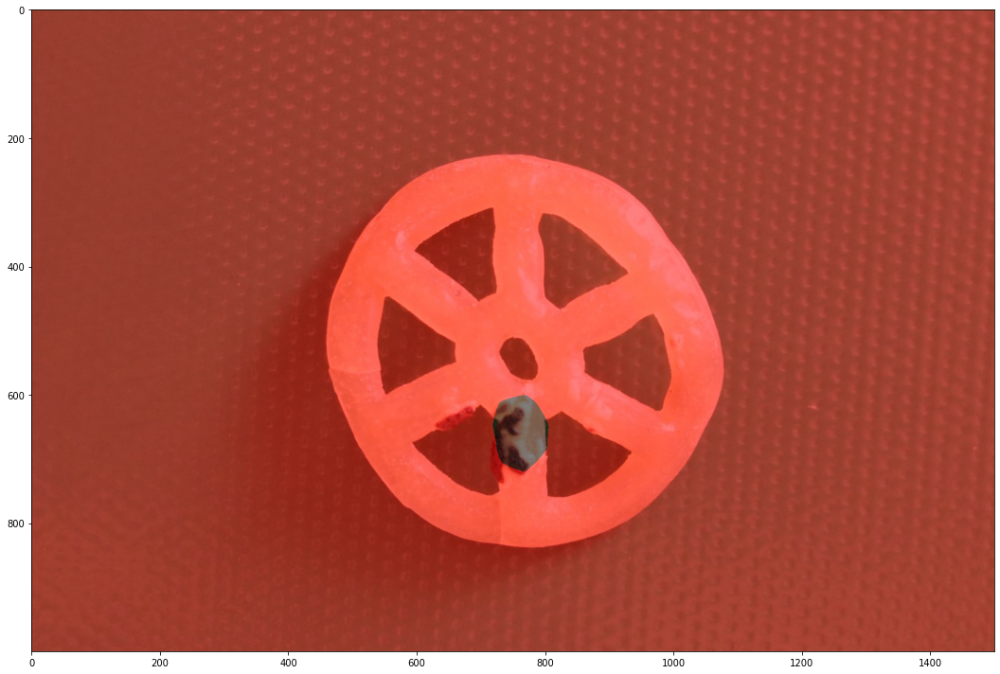

In [25]:
img = mmcv.imread('/content/test/000.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

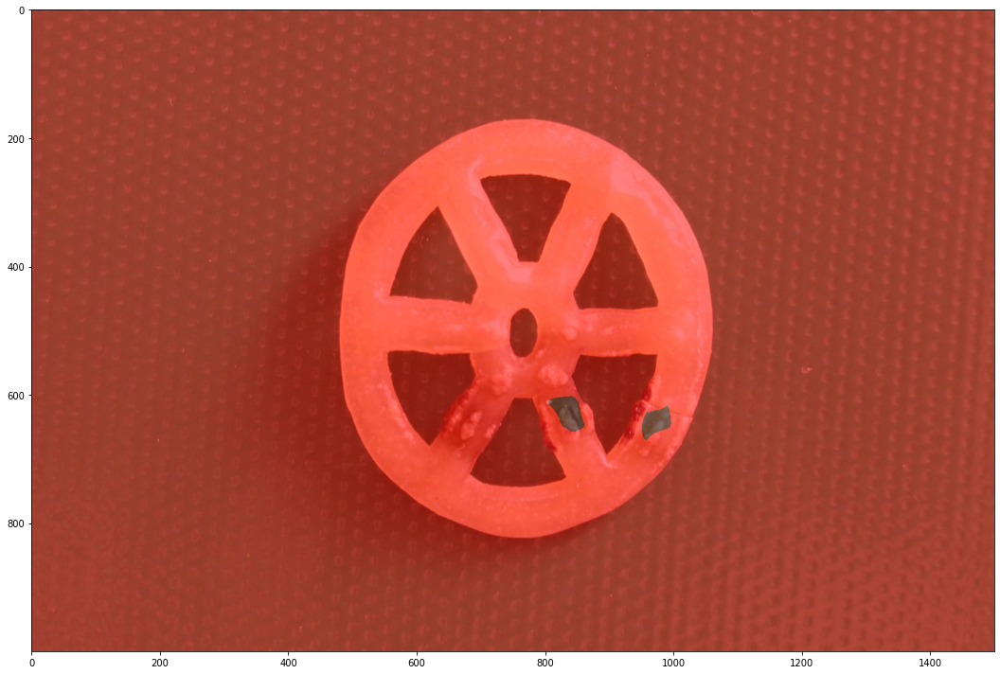

In [26]:
img = mmcv.imread('/content/test/001.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

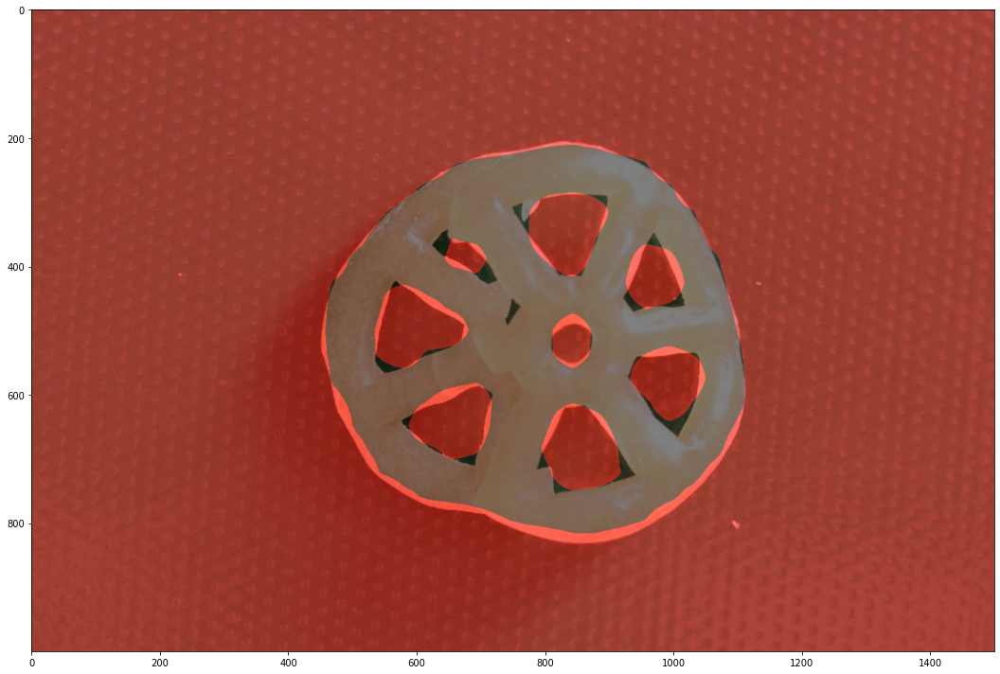

In [27]:
img = mmcv.imread('/content/test/048.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

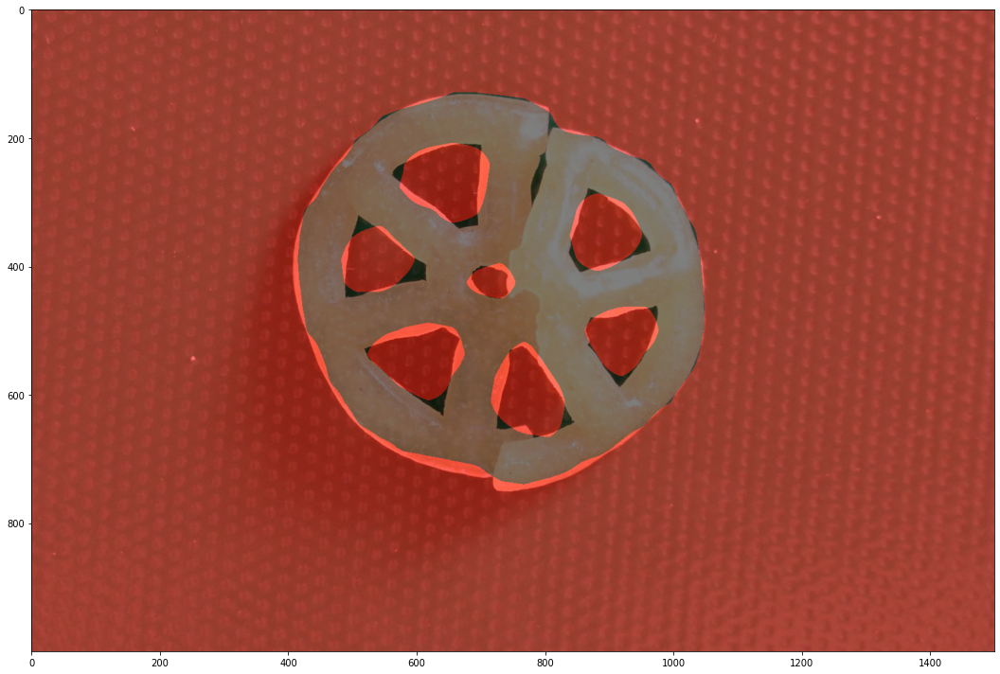

In [28]:
img = mmcv.imread('/content/test/049.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

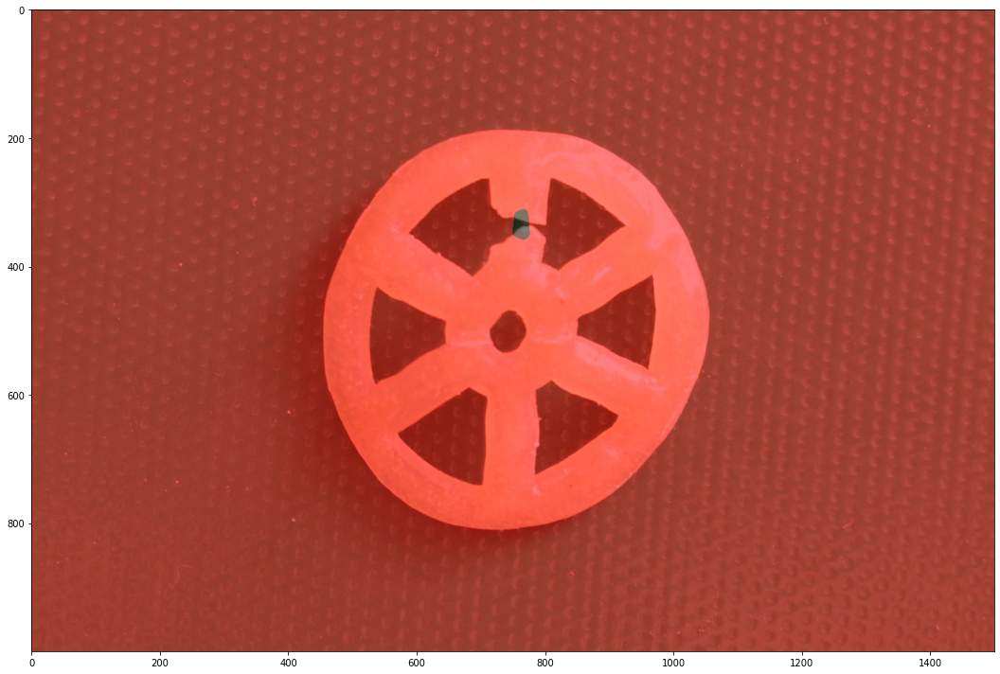

In [29]:
img = mmcv.imread('/content/test/062.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

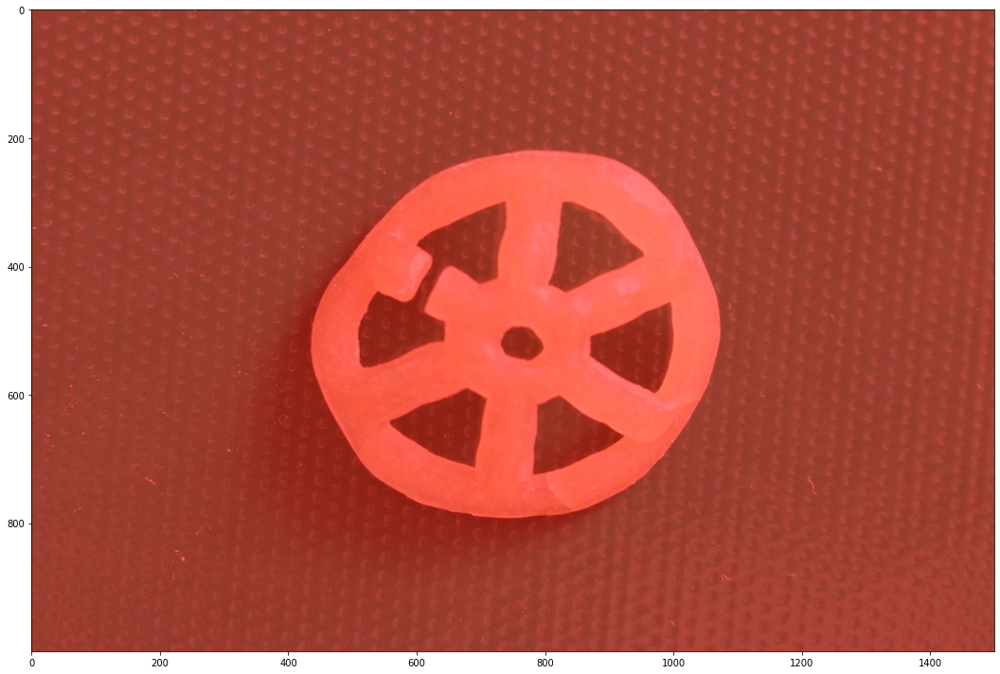

In [30]:
img = mmcv.imread('/content/test/063.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

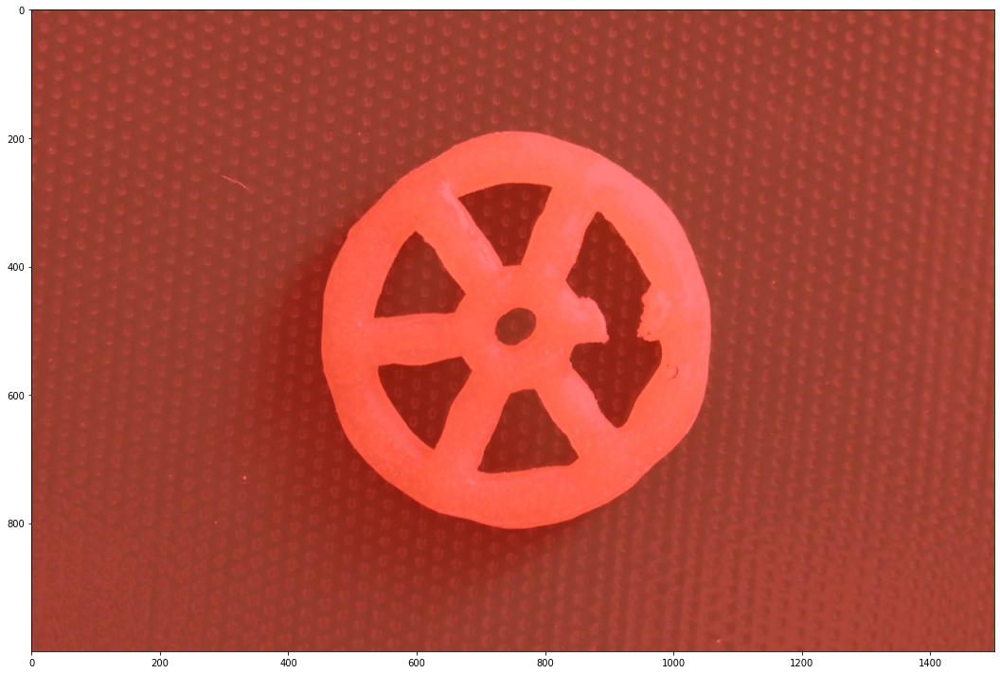

In [31]:
img = mmcv.imread('/content/test/069.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

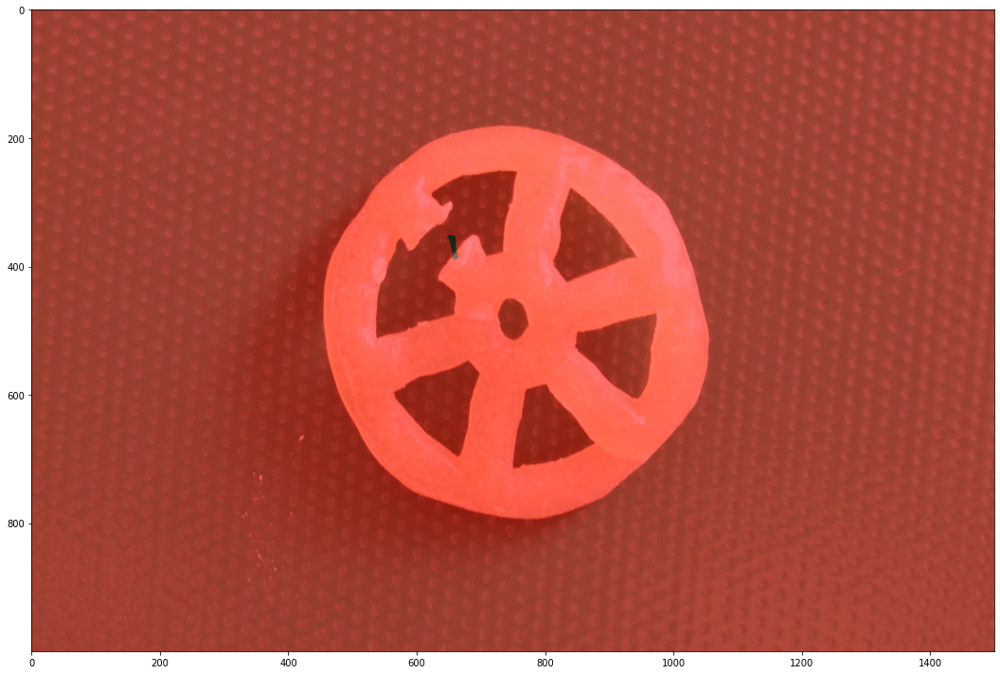

In [32]:
img = mmcv.imread('/content/test/072.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

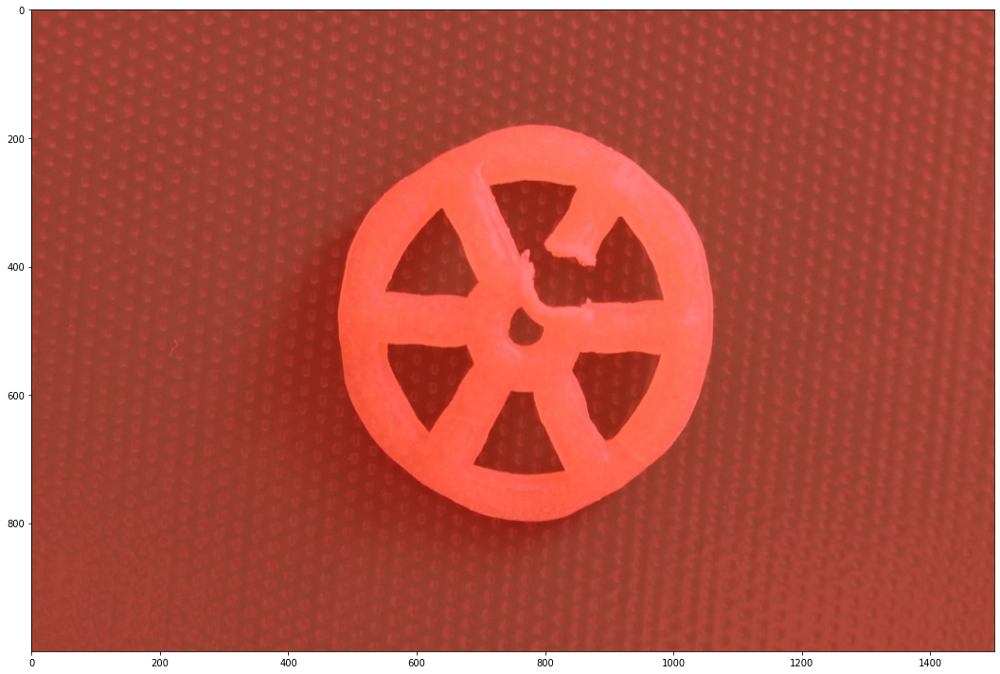

In [33]:
img = mmcv.imread('/content/test/074.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

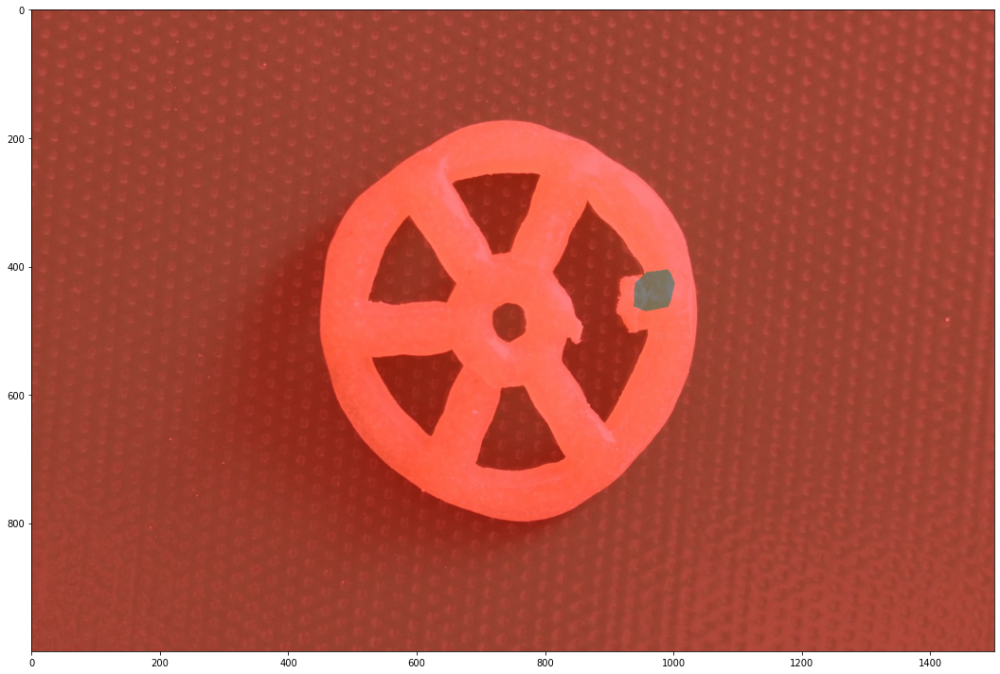

In [34]:
img = mmcv.imread('/content/test/075.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

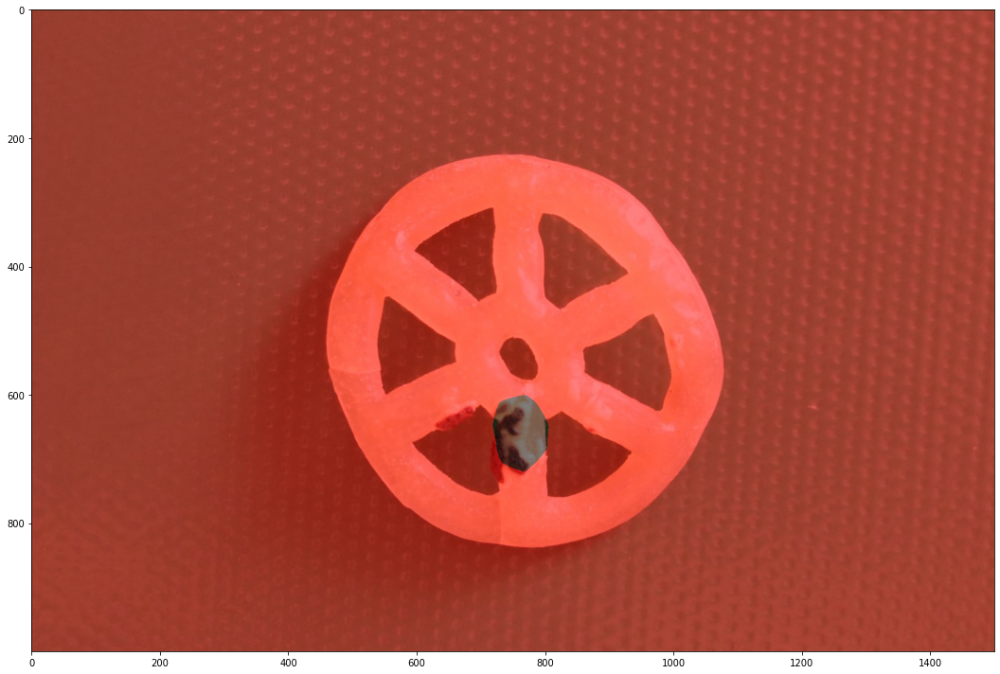

In [35]:
img = mmcv.imread('/content/test/000.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

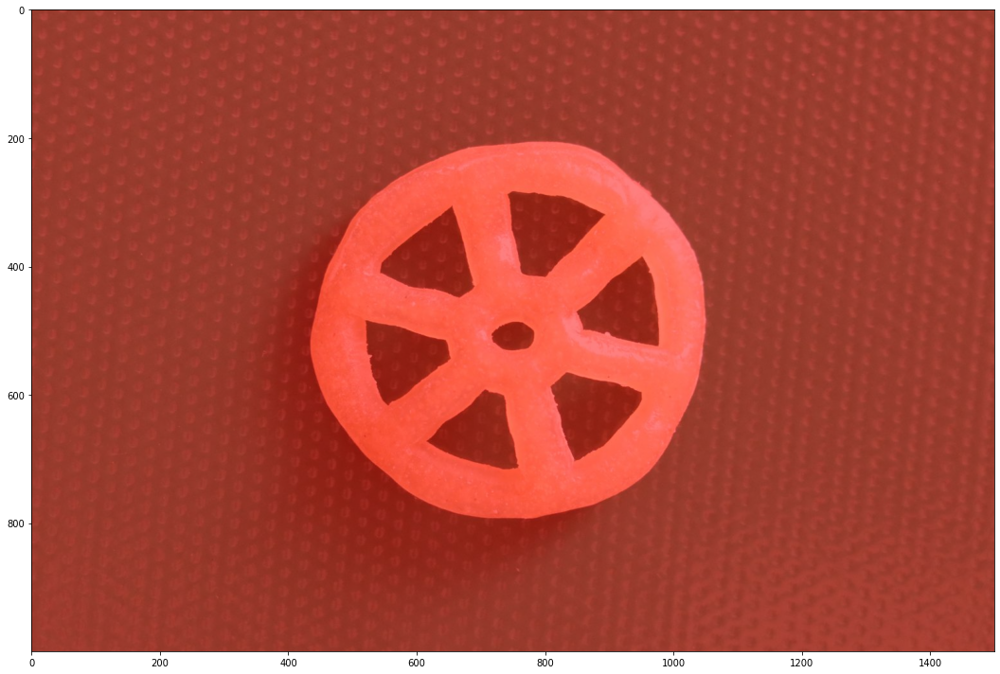

In [36]:
img = mmcv.imread('/content/test/good/000.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

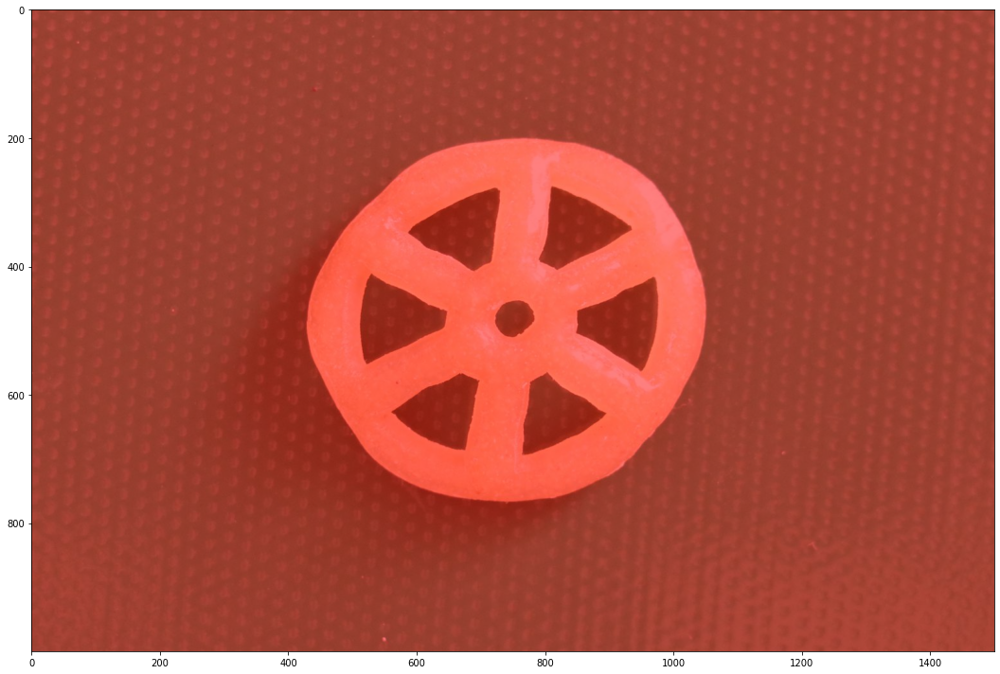

In [37]:
img = mmcv.imread('/content/test/good/056.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

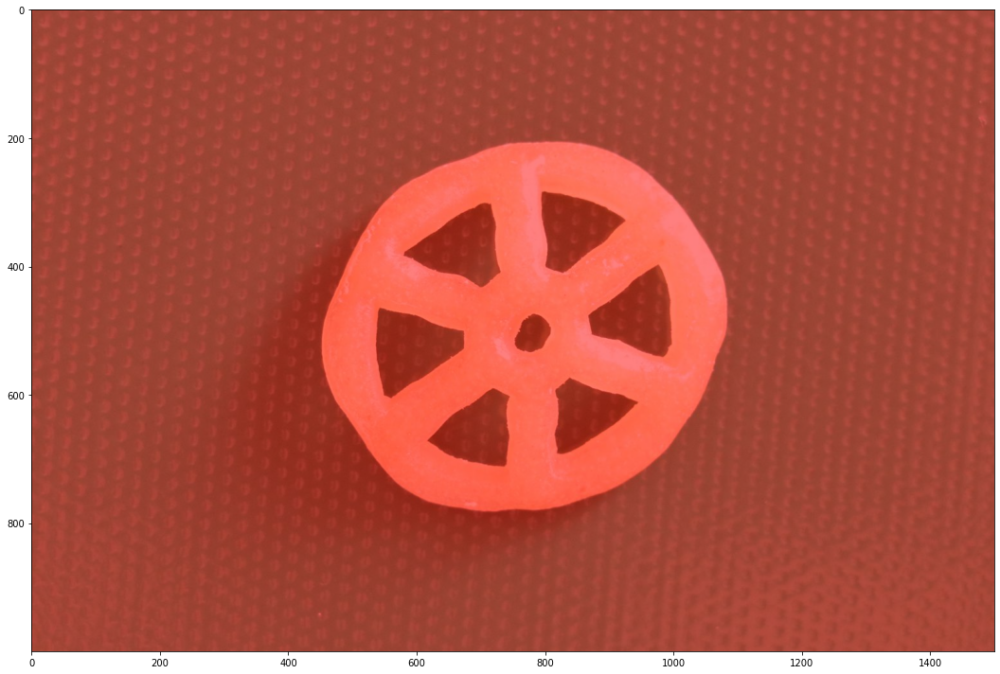

In [38]:
img = mmcv.imread('/content/test/good/118.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)

<Figure size 576x432 with 0 Axes>

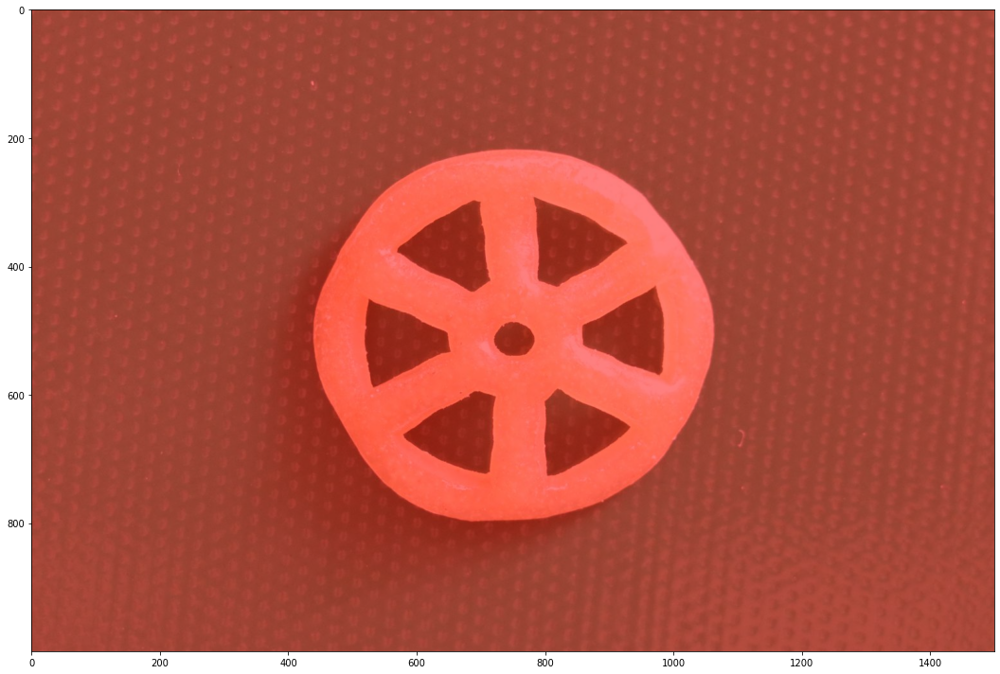

In [39]:
img = mmcv.imread('/content/test/good/213.JPG')

model.cfg = cfg
result = inference_segmentor(model, img)
plt.figure(figsize=(8, 6))
show_result_pyplot(model, img, result, palette)